<a href="https://colab.research.google.com/github/ebinjomonkottakal/Computer-Vision-Projects/blob/main/Object_detection_using_APIs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Imports and Setup

In [15]:
!pip install -U "tensorflow>2.5"
import os
import pathlib
import matplotlib
import matplotlib.pyplot as plt
import io
import scipy.misc
import numpy as np
from six import BytesIO
from PIL import Image,ImageDraw, ImageFont
from six.moves.urllib.request import urlopen
import tensorflow as tf
import tensorflow_hub as hub
tf.get_logger().setLevel('ERROR')

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# Utilities

In [16]:
def load_image_into_numpy_array(path):
  image = None
  if(path.startswith('https')):
    response = urlopen(path)
    image_data = response.read()
    image_data = BytesIO(image_data)
    image = Image.open(image_data)
  (im_width,im_height) = image.size
  return np.array(image.getdata()).reshape((1,im_height,im_width,3))#.astype(np.unit8)


# Visualization Tools

In [4]:
!git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 3825, done.
remote: Counting objects: 100% (3825/3825), done.
remote: Compressing objects: 100% (2926/2926), done.
remote: Total 3825 (delta 1111), reused 1944 (delta 849), pack-reused 0
Receiving objects: 100% (3825/3825), 49.55 MiB | 31.69 MiB/s, done.
Resolving deltas: 100% (1111/1111), done.


In [8]:
%%bash
sudo apt install -y protobuf-compiler
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Reading package lists...
Building dependency tree...
Reading state information...
protobuf-compiler is already the newest version (3.6.1.3-2ubuntu5.2).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing /content/models/research
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.2/14.2 MB 73.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 82.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.0/28.0 MB 37.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.6/116.6 kB 12.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [9]:
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import ops as utils_ops
%matplotlib inline

**Label maps correspond index numbers to category names, so that when our convolution network predicts 5, we know that this corresponds to airplane. Here we use internal utility functions, but anything that returns a dictionary mapping integers to appropriate string labels would be fine.**

**We are going, for simplicity, to load from the repository that we loaded the Object Detection API code**

In [10]:
PATH_TO_LABELS = './models/research/object_detection/data/mscoco_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS,use_display_name=True)

# Build a detection model and load pre-trained model weights

In [11]:
model_handle = 'https://tfhub.dev/tensorflow/centernet/hourglass_512x512/1'
hub_model = hub.load(model_handle)

# Loading image

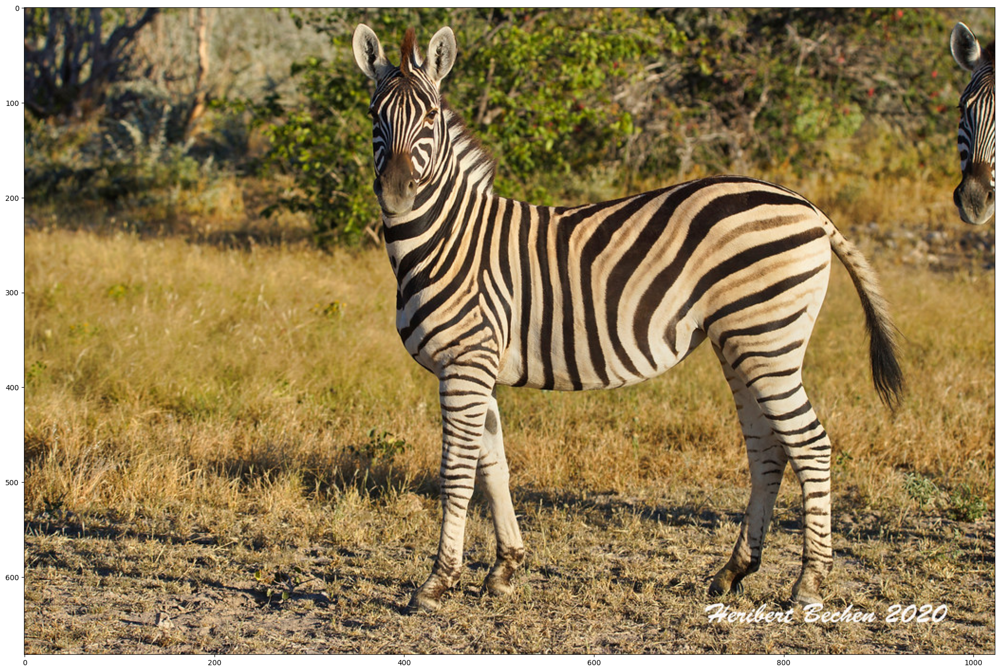

In [18]:
selected_image = 'https://live.staticflickr.com/65535/50721885183_66b9fa08fb_b.jpg'
image_np = load_image_into_numpy_array(selected_image)
plt.figure(figsize = (24,32))
plt.imshow(image_np[0])
plt.show()

In [21]:
# running inference
results = hub_model(image_np)
result = {key:value.numpy() for key,value in results.items()}
print(result.keys())

dict_keys(['detection_scores', 'detection_classes', 'num_detections', 'detection_boxes'])


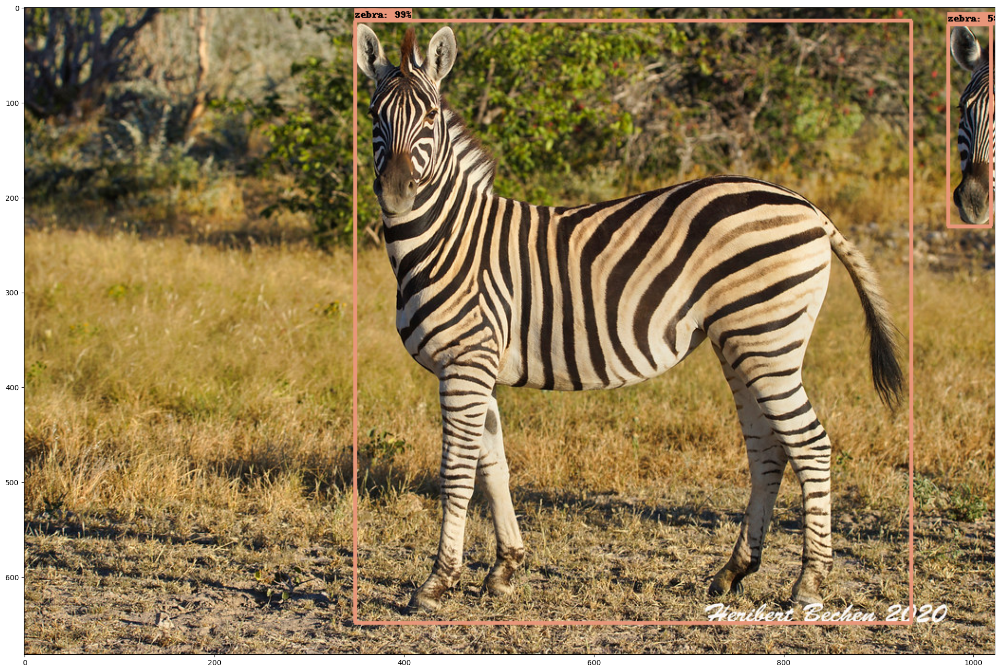

In [24]:
label_id_offset = 0
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
    image_np_with_detections[0],
    result['detection_boxes'][0],
    (result['detection_classes'][0]+label_id_offset).astype(int),
    result['detection_scores'][0],
    category_index,
    use_normalized_coordinates=True,
    min_score_thresh = .30
)
plt.figure(figsize=(24,32))
plt.imshow(image_np_with_detections[0])
plt.show()